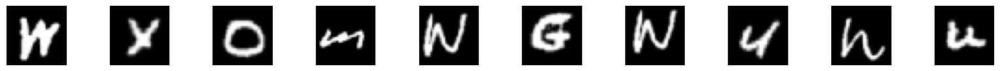

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import utils
import torch

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.optim as optim

from sklearn.model_selection import train_test_split

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

loaded_images = utils.load_images_from_zip()
emnist_data, emnist_labels = utils.load_true_emnist()

emnist_data = emnist_data.astype(np.float32)
loaded_images = loaded_images.astype(np.float32)

utils.plot_images(loaded_images[10:20])

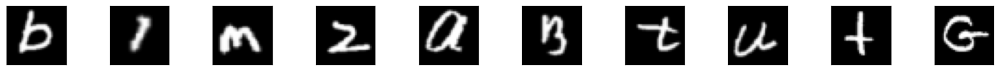

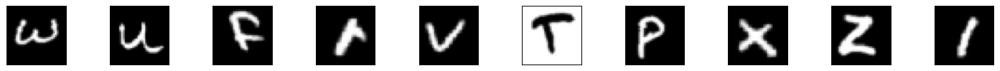

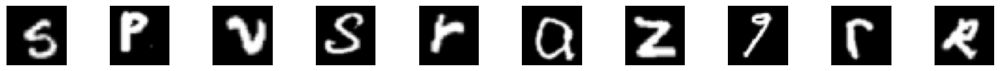

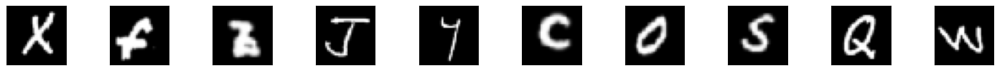

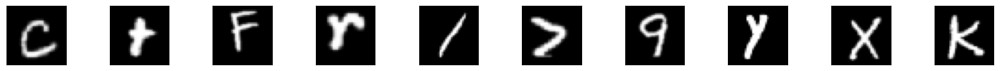

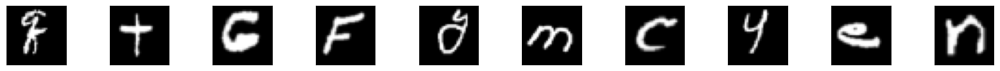

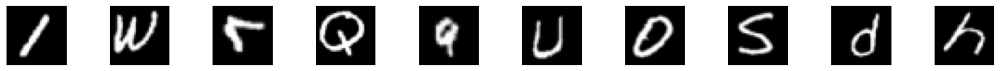

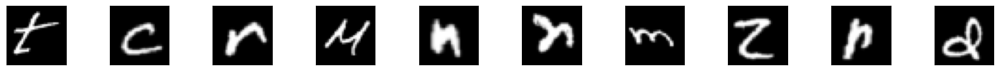

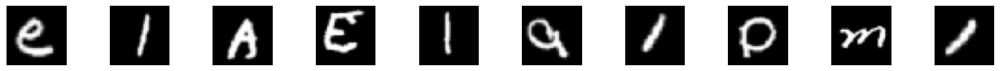

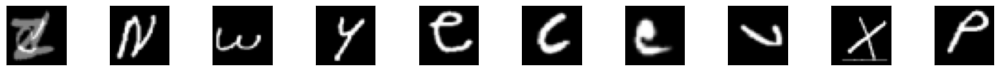

In [2]:
indexes = np.random.choice(len(loaded_images), 100, replace=False)
data = torch.tensor(loaded_images[indexes]).float().to(device)
utils.plot_images(data)

In [21]:
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
import torch.optim as optim

loaded_images_nn = torch.tensor(
    np.reshape(loaded_images, (len(loaded_images), 32 * 32)), 
    device=device,
    dtype=torch.float32
    )
data_train, data_test = train_test_split(loaded_images_nn, test_size=0.2, random_state=1)

train_loader = torch.utils.data.DataLoader(data_train, batch_size=256, shuffle=True)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=256, shuffle=False)


Model structure coming from [here](https://www.geeksforgeeks.org/implement-convolutional-autoencoder-in-pytorch-with-cuda/)


In [39]:
class Autoencoder(nn.Module):
    def __init__(self, input_dim=data_train.shape[1]):
        super(Autoencoder, self).__init__()
        self.img_size = int(np.sqrt(input_dim))
        
        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(16, 8, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Flatten(),
            nn.Linear(8 * (self.img_size//4) * (self.img_size//4), 32),
            nn.ReLU()
        )
        
        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(32, 8 * (self.img_size//4) * (self.img_size//4)),
            nn.ReLU(),
            Reshape(-1, 8, self.img_size//4, self.img_size//4),
            nn.ConvTranspose2d(8, 16, 
                              kernel_size=3, 
                              stride=2, 
                              padding=1, 
                              output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 1, 
                              kernel_size=3, 
                              stride=2, 
                              padding=1, 
                              output_padding=1),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        if len(x.shape) == 2:
            x = x.view(-1, 1, self.img_size, self.img_size)
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded.view(-1, self.img_size * self.img_size)

In [24]:
model = Autoencoder()
model = model.to(device)

optimizer = optim.Adam(model.parameters())
loss_fn = torch.nn.MSELoss()

In [33]:
def train_model(model, loss_fn, data_loader=None, epochs=10, optimizer=None):
    model.train()
    for epoch in range(epochs):
        for batch_idx, data in enumerate(train_loader):
            optimizer.zero_grad()
            output = model(data)
            loss = loss_fn(output, data)
            loss.backward()
            optimizer.step()
            if batch_idx % 100 == 0:
                print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                    epoch, batch_idx * len(data), len(data_loader.dataset),
                    100. * batch_idx / len(data_loader), loss.data.item()))


In [34]:
train_model(model, loss_fn, data_loader=train_loader, epochs=10, optimizer=optimizer)

Train Epoch: 0 [0/104845 (0%)]	Loss: 0.055044
Train Epoch: 0 [25600/104845 (24%)]	Loss: 0.040627
Train Epoch: 0 [51200/104845 (49%)]	Loss: 0.034228
Train Epoch: 0 [76800/104845 (73%)]	Loss: 0.030850
Train Epoch: 0 [102400/104845 (98%)]	Loss: 0.030327
Train Epoch: 1 [0/104845 (0%)]	Loss: 0.030110
Train Epoch: 1 [25600/104845 (24%)]	Loss: 0.029102
Train Epoch: 1 [51200/104845 (49%)]	Loss: 0.029019
Train Epoch: 1 [76800/104845 (73%)]	Loss: 0.028942
Train Epoch: 1 [102400/104845 (98%)]	Loss: 0.026072
Train Epoch: 2 [0/104845 (0%)]	Loss: 0.026191
Train Epoch: 2 [25600/104845 (24%)]	Loss: 0.025210
Train Epoch: 2 [51200/104845 (49%)]	Loss: 0.023747
Train Epoch: 2 [76800/104845 (73%)]	Loss: 0.024262
Train Epoch: 2 [102400/104845 (98%)]	Loss: 0.024664
Train Epoch: 3 [0/104845 (0%)]	Loss: 0.026486
Train Epoch: 3 [25600/104845 (24%)]	Loss: 0.022786
Train Epoch: 3 [51200/104845 (49%)]	Loss: 0.023903
Train Epoch: 3 [76800/104845 (73%)]	Loss: 0.024877
Train Epoch: 3 [102400/104845 (98%)]	Loss: 0.024

In [32]:
from utils import to_img

def plot_reconstructions2(model, data, base_dim=32):
    """
    Plot reconstructions from a dataset set.
    The top row is the original digits,
    the middle row is the encoded vector,
    and the bottom row is the decoder reconstruction.
    """
    
    true_imgs = data
    # Reshape data for the encoder
    data = data.view(-1, 1, base_dim, base_dim)  # Add this line
    # Encode and then decode the images
    encoded_imgs = model.encoder(data)
    decoded_imgs = model.decoder(encoded_imgs)

    # Convert images for plotting
    true_imgs = to_img(true_imgs, base_dim=base_dim)
    decoded_imgs = to_img(decoded_imgs, base_dim=base_dim)
    encoded_imgs = encoded_imgs.cpu().data.numpy()

    n = 10  # Number of images to display at the same time
    for j in range(0, len(data), 10):
        plt.figure(figsize=(20, 4))
        for i in range(n):
            if i+j >= len(data):
                break
            # Display original images
            ax = plt.subplot(3, n, i + 1)
            plt.imshow(true_imgs[i + j])
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            # Display encoded representations
            ax = plt.subplot(3, n, i + 1 + n)
            plt.imshow(encoded_imgs[i + j].reshape(-1, 4))
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            # Display reconstructed images
            ax = plt.subplot(3, n, i + 1 + 2 * n)
            plt.imshow(decoded_imgs[i + j])
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

/var/folders/3l/_hdyb1rx2yq_frxtjyy_t_7m0000gn/T/ipykernel_24019/827936534.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20, 4))


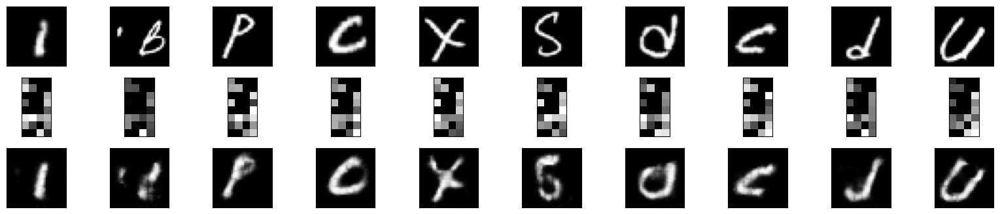

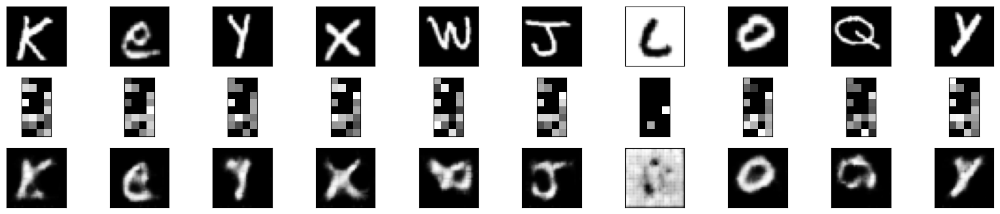

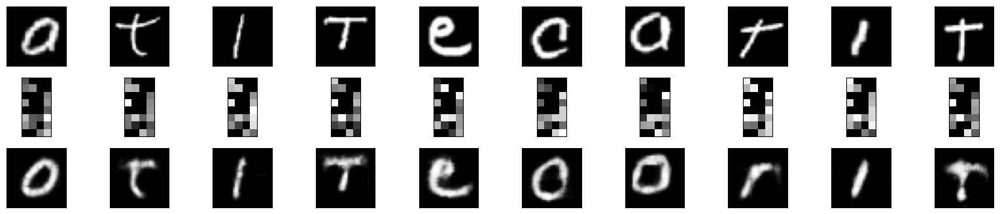

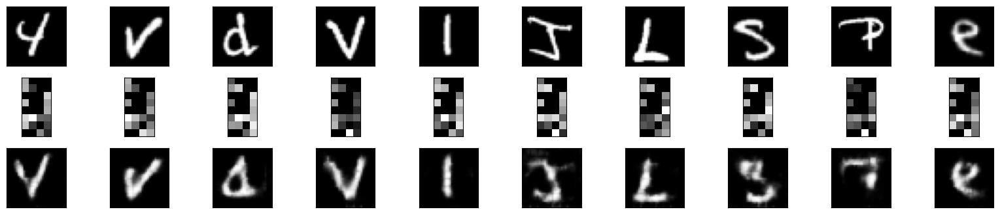

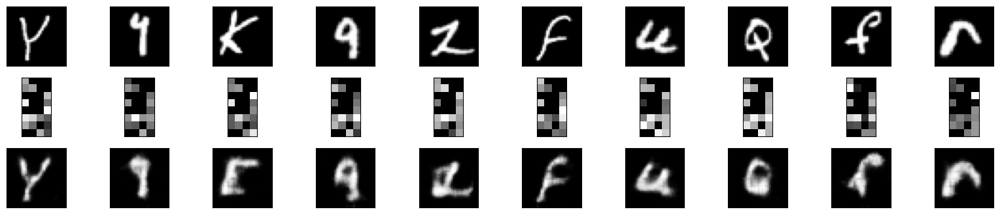

...

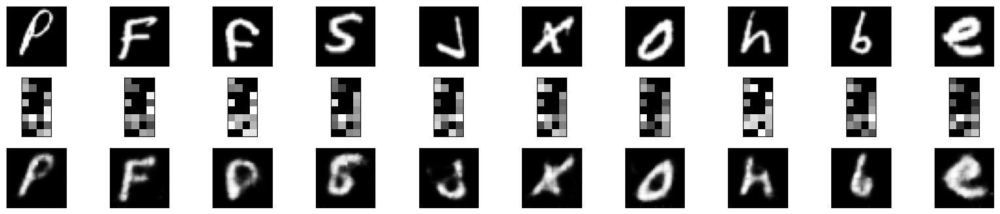

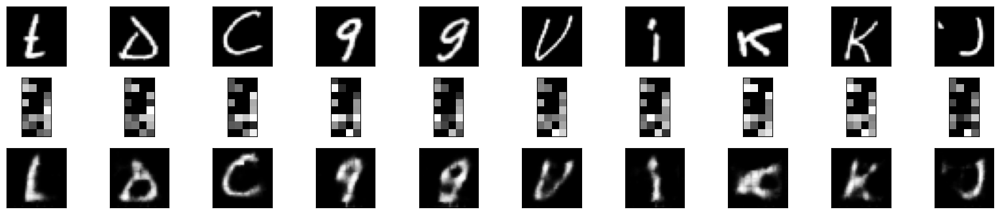

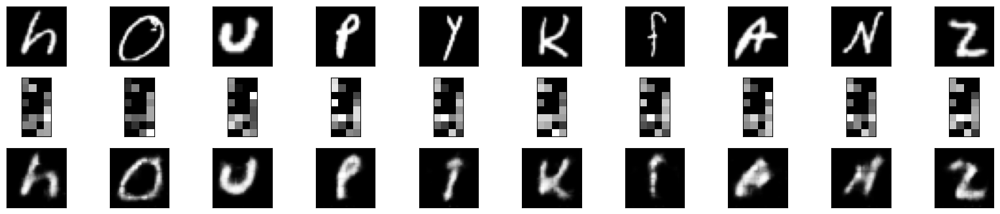

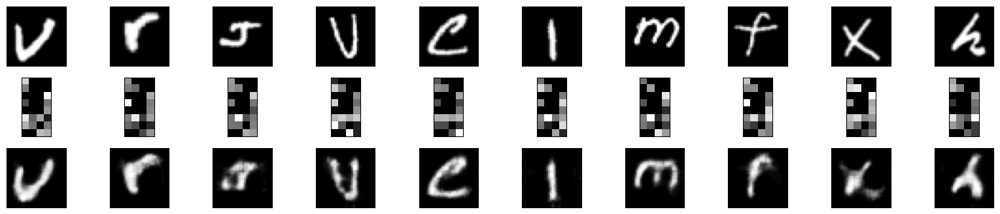

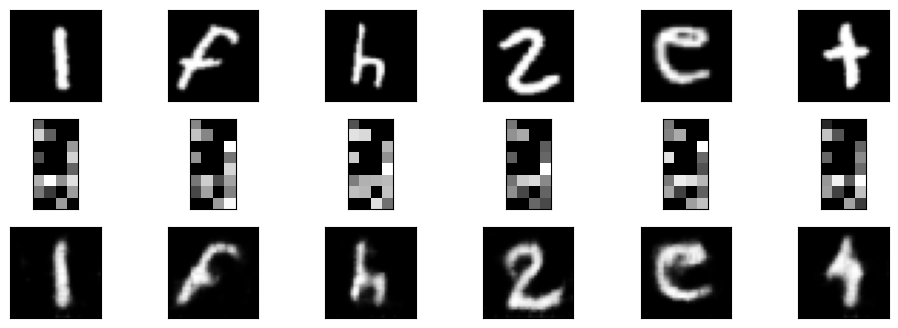

In [35]:
data_viz = next(iter(test_loader))
plot_reconstructions2(model, data_viz)

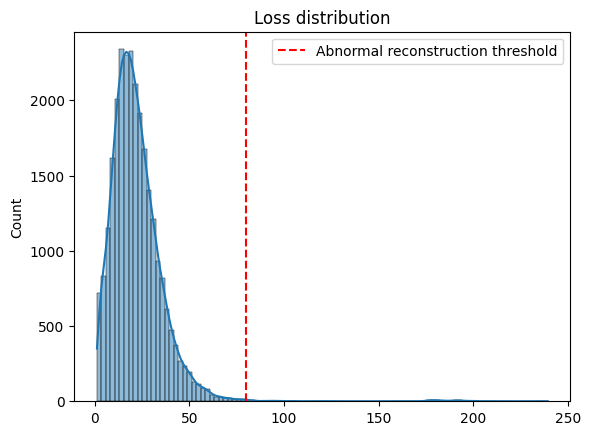

In [36]:
import seaborn as sns

eval_loss = torch.nn.MSELoss(reduction='none')
losses = eval_loss(model(data_test), data_test).sum(axis=1).detach().cpu().numpy()


sns.histplot(losses, bins=100, kde=True)
plt.axvline(x=80, color='r', linestyle='--', label='Abnormal reconstruction threshold')
plt.title('Loss distribution')
plt.legend()
plt.show()

torch.Size([95, 1024])


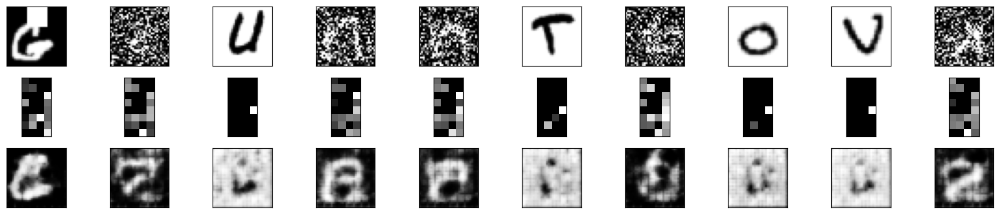

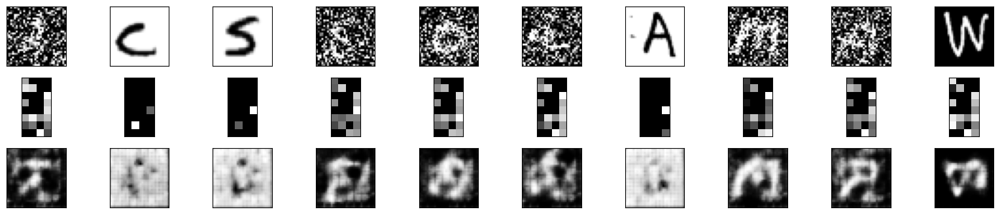

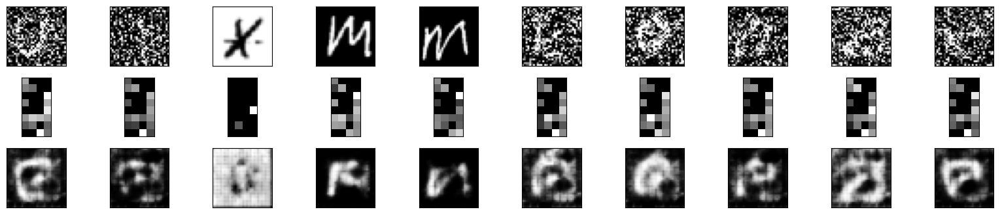

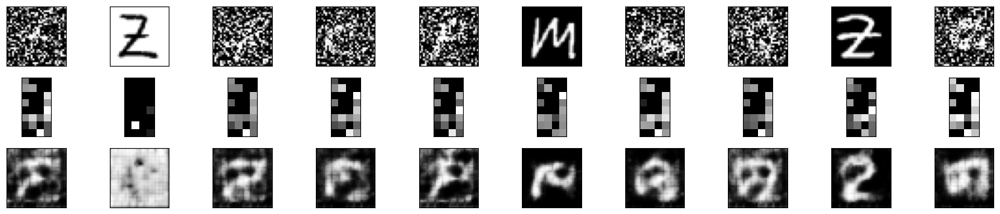

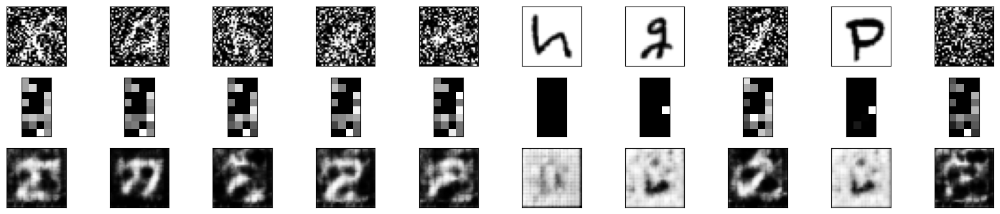

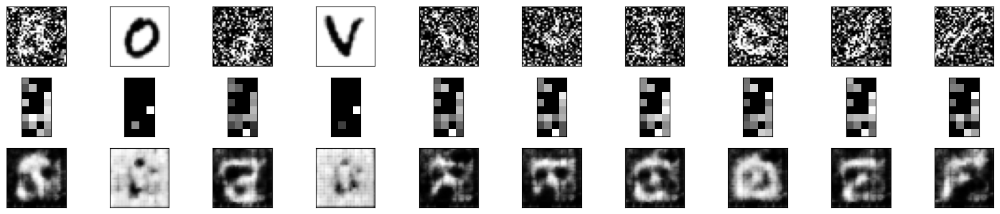

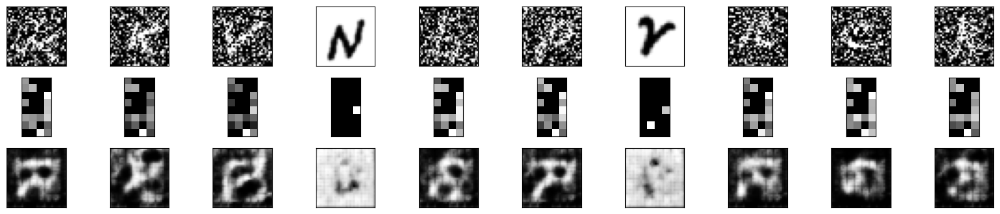

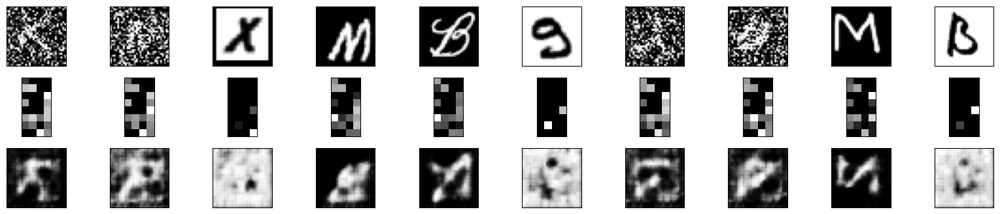

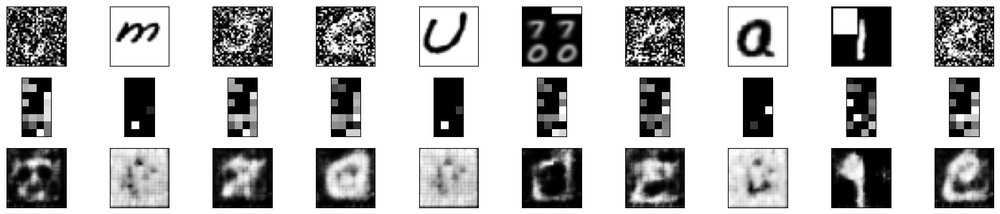

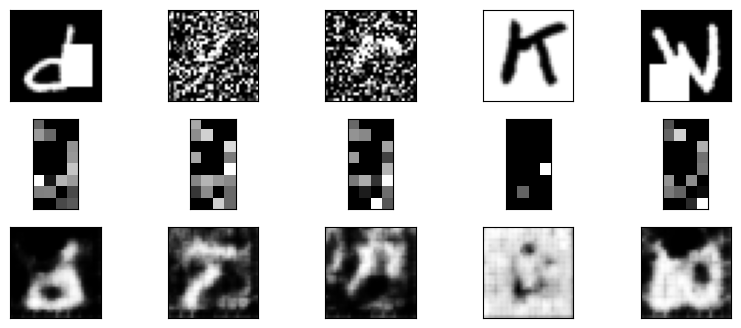

In [37]:
mask = losses > 80
outliers = data_test[mask]
print(outliers.shape)
plot_reconstructions2(model, outliers)

All the captures instances are corrupted ones, with more various examples than previously (noise, white, with white square, errors or duplicata)

## Tentative VAE 

In [38]:
import torch.nn as nn
import torch


class Encoder(nn.Module):
    
    def __init__(self, input_dim, hidden_dim, latent_dim):
        super(Encoder, self).__init__()

        self.FC_input = nn.Linear(input_dim, hidden_dim)
        self.FC_input2 = nn.Linear(hidden_dim, hidden_dim)
        self.FC_mean  = nn.Linear(hidden_dim, latent_dim)
        self.FC_var   = nn.Linear (hidden_dim, latent_dim)
        
        self.LeakyReLU = nn.LeakyReLU(0.2)
        
        self.training = True
        
    def forward(self, x):
        h_       = self.LeakyReLU(self.FC_input(x))
        h_       = self.LeakyReLU(self.FC_input2(h_))
        mean     = self.FC_mean(h_)
        log_var  = self.FC_var(h_)                     
                                                       
        return mean, log_var
    
class Decoder(nn.Module):
    def __init__(self, latent_dim, hidden_dim, output_dim):
        super(Decoder, self).__init__()
        self.FC_hidden = nn.Linear(latent_dim, hidden_dim)
        self.FC_hidden2 = nn.Linear(hidden_dim, hidden_dim)
        self.FC_output = nn.Linear(hidden_dim, output_dim)
        
        self.LeakyReLU = nn.LeakyReLU(0.2)
        
    def forward(self, x):
        h     = self.LeakyReLU(self.FC_hidden(x))
        h     = self.LeakyReLU(self.FC_hidden2(h))
        
        x_hat = torch.sigmoid(self.FC_output(h))
        return x_hat
    
class Model(nn.Module):
    def __init__(self, Encoder, Decoder):
        super(Model, self).__init__()
        self.Encoder = Encoder
        self.Decoder = Decoder
        
    def reparameterization(self, mean, var):
        epsilon = torch.randn_like(var).to(device)        # sampling epsilon        
        z = mean + var*epsilon                          # reparameterization trick
        return z
        
                
    def forward(self, x):
        mean, log_var = self.Encoder(x)
        z = self.reparameterization(mean, torch.exp(0.5 * log_var)) 
        x_hat            = self.Decoder(z)
        
        return x_hat, mean, log_var


In [10]:
x_dim = 32 * 32  # input images are 32x32 pixels flattened
hidden_dim = 512  # power of 2 smaller than input_dim
latent_dim = 32   # compressed representation size

In [18]:
encoder = Encoder(input_dim=x_dim, hidden_dim=hidden_dim, latent_dim=latent_dim)
decoder = Decoder(latent_dim=latent_dim, hidden_dim = hidden_dim, output_dim = x_dim)

model = Model(Encoder=encoder, Decoder=decoder).to(device)

In [26]:
from torch.optim import Adam

BCE_loss = nn.BCELoss()

def loss_function(x, x_hat, mean, log_var):
    reproduction_loss = nn.functional.binary_cross_entropy(x_hat, x, reduction='sum')
    KLD      = - 0.5 * torch.sum(1+ log_var - mean.pow(2) - log_var.exp())

    return reproduction_loss + KLD


optimizer = Adam(model.parameters(), lr=1e-3)

In [29]:
def train_model(model, loss_fn, data_loader=None, epochs=10, optimizer=None):
    model.train()
    for epoch in range(epochs):
        for batch_idx, data in enumerate(train_loader):
            optimizer.zero_grad()
            # Get all outputs from the model
            x_hat, mean, log_var = model(data)  # Now properly unpacking all three values
            # Calculate loss using all outputs
            loss = loss_fn(data, x_hat, mean, log_var)  # Pass all required arguments
            loss.backward()
            optimizer.step()
            if batch_idx % 100 == 0:
                print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                    epoch, batch_idx * len(data), len(data_loader.dataset),
                    100. * batch_idx / len(data_loader), loss.data.item()))

In [36]:
train_model(model, loss_function, data_loader=train_loader, epochs=10, optimizer=optimizer)

Train Epoch: 0 [0/104845 (0%)]	Loss: 52196.914062
Train Epoch: 0 [25600/104845 (24%)]	Loss: 47983.230469
Train Epoch: 0 [51200/104845 (49%)]	Loss: 47470.300781
Train Epoch: 0 [76800/104845 (73%)]	Loss: 45902.816406
Train Epoch: 0 [102400/104845 (98%)]	Loss: 44842.867188
Train Epoch: 1 [0/104845 (0%)]	Loss: 44986.628906
Train Epoch: 1 [25600/104845 (24%)]	Loss: 44771.578125
Train Epoch: 1 [51200/104845 (49%)]	Loss: 43210.136719
Train Epoch: 1 [76800/104845 (73%)]	Loss: 43218.414062
Train Epoch: 1 [102400/104845 (98%)]	Loss: 43947.078125
Train Epoch: 2 [0/104845 (0%)]	Loss: 43504.496094
Train Epoch: 2 [25600/104845 (24%)]	Loss: 42482.609375
Train Epoch: 2 [51200/104845 (49%)]	Loss: 43684.472656
Train Epoch: 2 [76800/104845 (73%)]	Loss: 41214.707031
Train Epoch: 2 [102400/104845 (98%)]	Loss: 41367.628906
Train Epoch: 3 [0/104845 (0%)]	Loss: 43871.859375
Train Epoch: 3 [25600/104845 (24%)]	Loss: 42178.152344
Train Epoch: 3 [51200/104845 (49%)]	Loss: 41908.148438
Train Epoch: 3 [76800/10484

In [34]:
def plot_reconstructions3(model, data, base_dim=32):
    """
    Plot reconstructions from a dataset set.
    The top row is the original digits,
    the middle row is the encoded vector,
    and the bottom row is the decoder reconstruction.
    """
    
    true_imgs = data
    
    # Get the encodings and reconstructions from the VAE
    with torch.no_grad(): 
        mean, log_var = model.Encoder(data)
        z = model.reparameterization(mean, torch.exp(0.5 * log_var))
        decoded_imgs = model.Decoder(z)

    # Convert images for plotting
    true_imgs = to_img(true_imgs, base_dim=base_dim)
    decoded_imgs = to_img(decoded_imgs, base_dim=base_dim)
    # For VAE, we'll show the mean values of the latent space
    encoded_imgs = mean.cpu().data.numpy()

    n = 10  # Number of images to display at the same time
    for j in range(0, len(data), 10):
        plt.figure(figsize=(20, 4))
        for i in range(n):
            if i+j >= len(data):
                break
            # Display original images
            ax = plt.subplot(3, n, i + 1)
            plt.imshow(true_imgs[i + j])
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            # Display encoded representations (mean values)
            ax = plt.subplot(3, n, i + 1 + n)
            plt.imshow(encoded_imgs[i + j].reshape(-1, 4))  # Adjust reshape dimensions if needed
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            # Display reconstructed images
            ax = plt.subplot(3, n, i + 1 + 2 * n)
            plt.imshow(decoded_imgs[i + j])
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

/var/folders/3l/_hdyb1rx2yq_frxtjyy_t_7m0000gn/T/ipykernel_29232/2463662364.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20, 4))


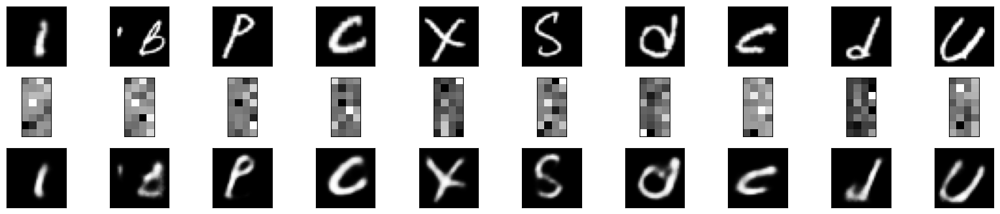

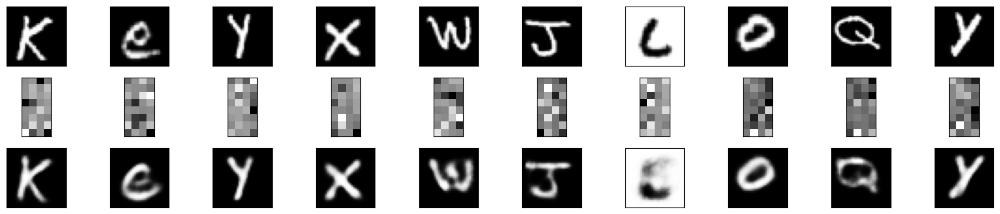

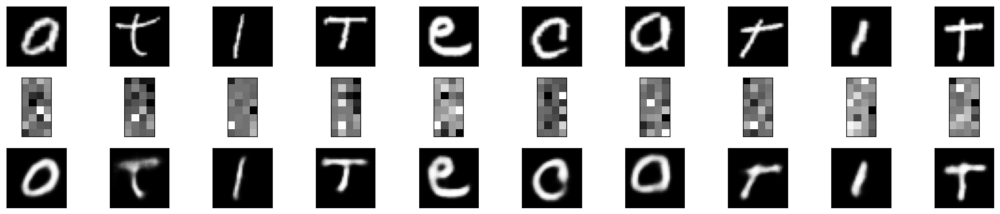

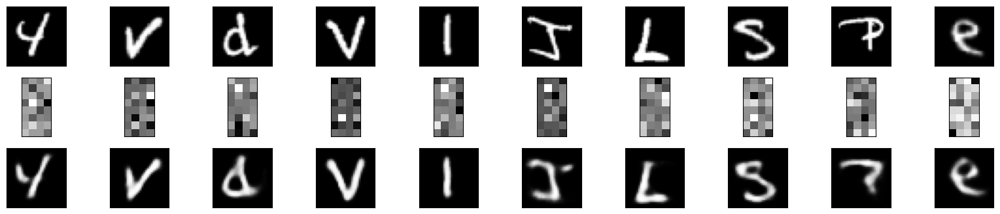

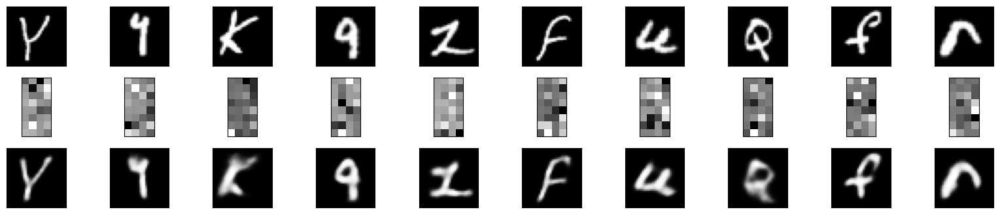

...

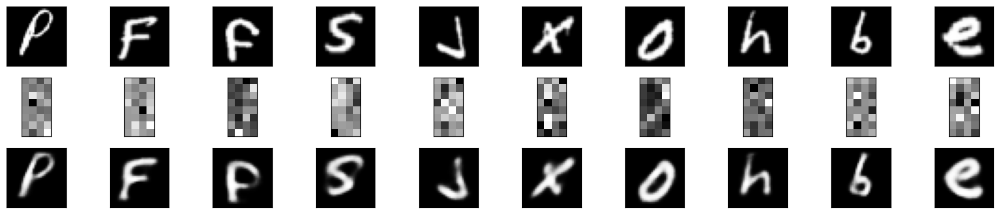

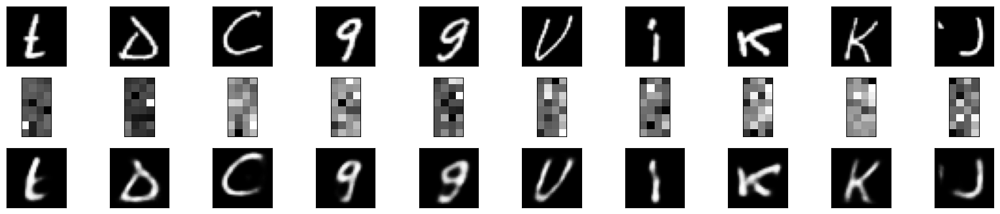

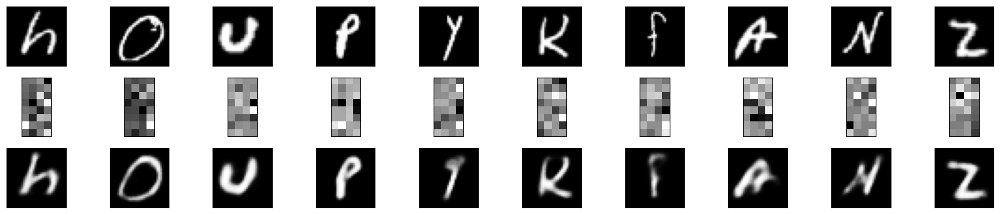

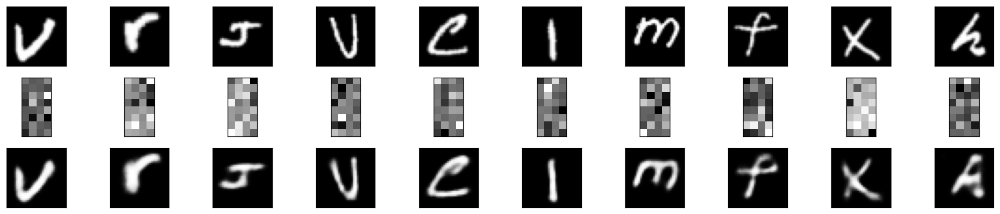

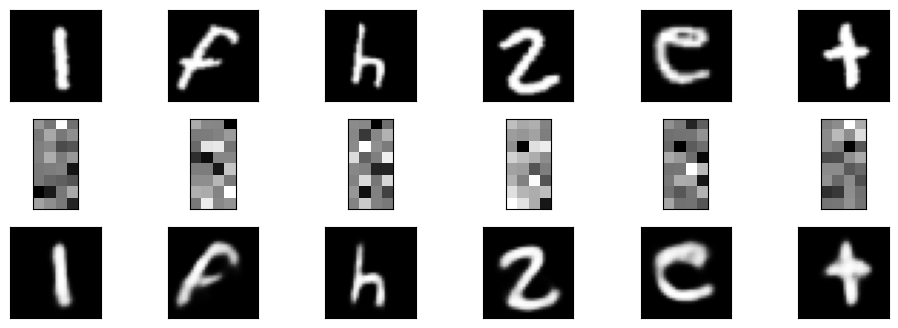

In [37]:
data_viz = next(iter(test_loader))
plot_reconstructions3(model, data_viz)

Threshold value at 99 percentile: 274.39


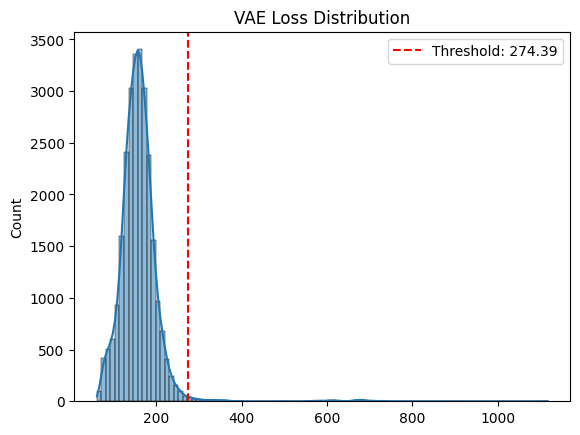

In [45]:
import seaborn as sns
import numpy as np

# Compute losses using the VAE loss function
with torch.no_grad():
    x_hat, mean, log_var = model(data_test)
    # Calculate individual losses for each sample
    reconstruction_loss = nn.functional.binary_cross_entropy(x_hat, data_test, reduction='none').sum(dim=1)
    kld_loss = -0.5 * torch.sum(1 + log_var - mean.pow(2) - log_var.exp(), dim=1)
    # Total loss per sample
    losses = (reconstruction_loss + kld_loss).cpu().numpy()

# Choose the treshold value when you think this becomes strange, I chose 99%
threshold = np.percentile(losses, 99)
print(f"Threshold value at {99} percentile: {threshold:.2f}")
sns.histplot(losses, bins=100, kde=True)
plt.axvline(x=threshold, color='r', linestyle='--', label=f'Threshold: {threshold:.2f}')
plt.title('VAE Loss Distribution')
plt.legend()
plt.show()

torch.Size([263, 1024])


/var/folders/3l/_hdyb1rx2yq_frxtjyy_t_7m0000gn/T/ipykernel_29232/2463662364.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20, 4))


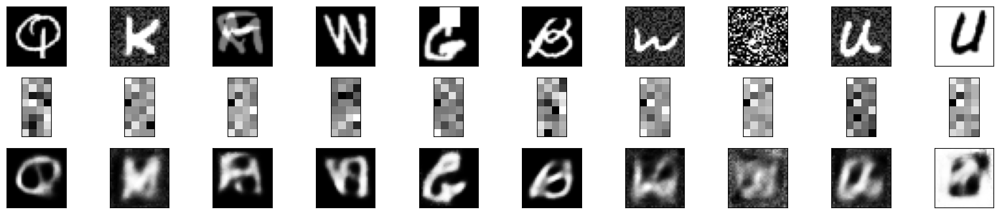

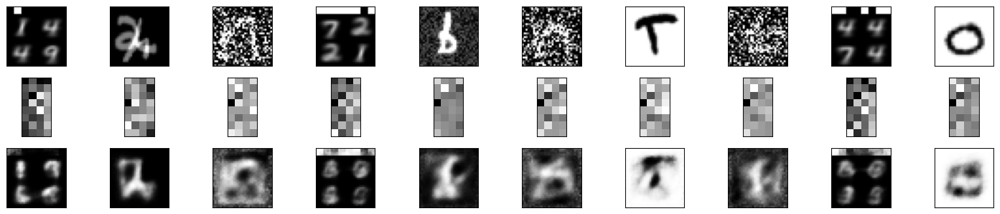

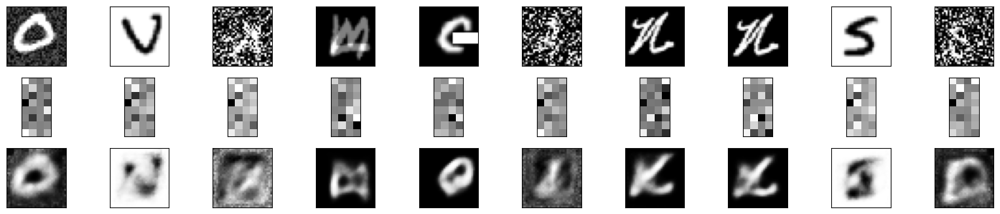

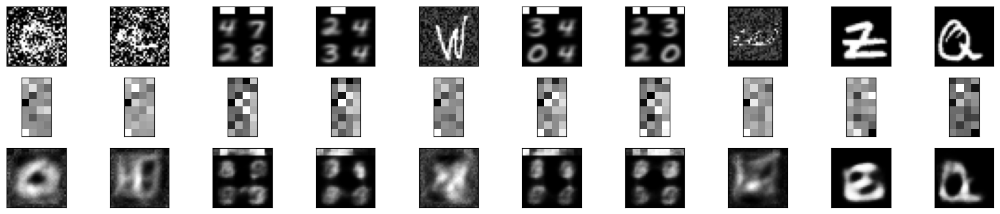

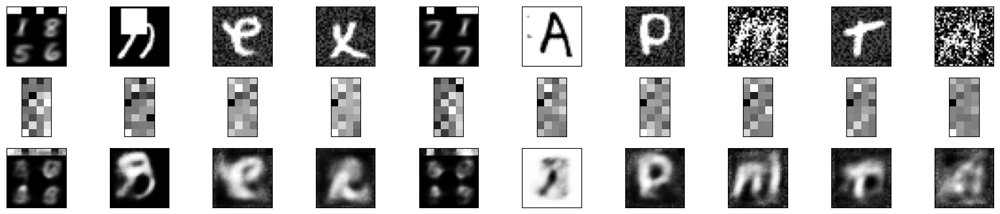

...

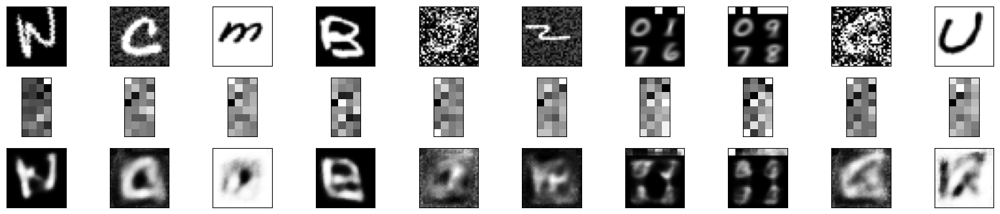

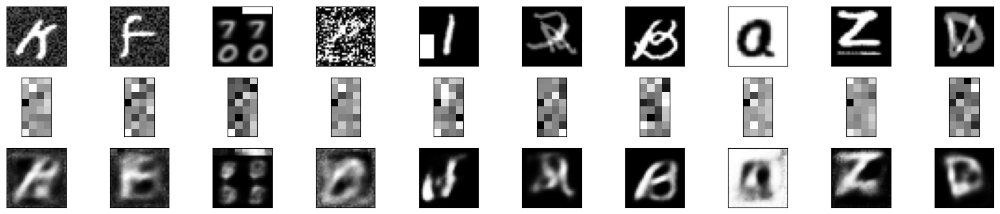

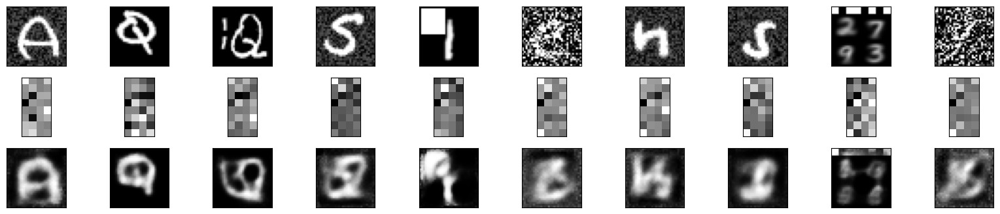

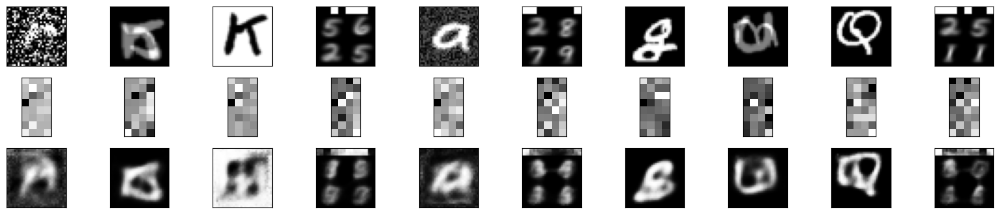

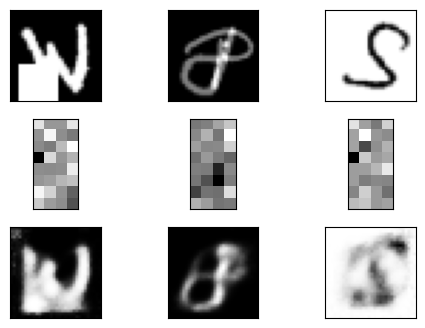

In [44]:
mask = losses > 275
outliers = data_test[mask]
print(outliers.shape)
plot_reconstructions3(model, outliers)

Not bad hein ? C'est français